$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [1]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

Using cache found in /home/hay.e/.cache/torch/hub/ultralytics_yolov5_master
requirements: Ultralytics requirement "gitpython>=3.1.30" not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)
YOLOv5 🚀 2023-5-30 Python-3.8.12 torch-1.10.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Calculate the number of pixels within a bounding box and the number in the background.
   
   **Hint**: Given you stored the model output in a varibale named 'results', you may find 'results.pandas().xyxy' helpful 
4. Look at the inference results and answer the question below.


image 1/2: 183x275 2 persons, 1 surfboard
image 2/2: 750x750 2 cats, 1 dog
Speed: 78.1ms pre-process, 91.3ms inference, 6.5ms NMS per image at shape (2, 3, 640, 640)


Image: imgs/DolphinsInTheSky.jpg
Number of pixels within bounding boxes: 15213
Number of pixels in the background: 35112



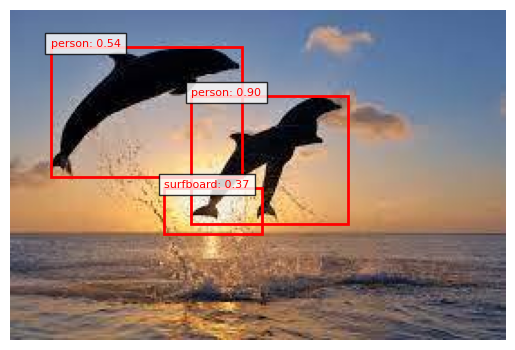

Image: imgs/cat-shiba-inu-2.jpg
Number of pixels within bounding boxes: 499089
Number of pixels in the background: 63411



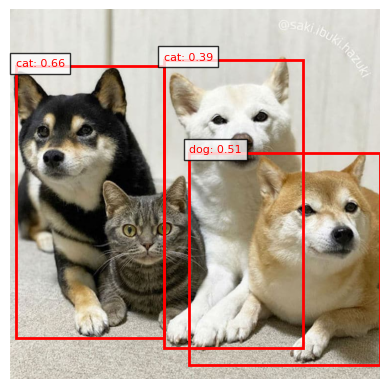

In [2]:
%matplotlib inline

import torch
import cv2
import numpy as np
from matplotlib import pyplot as plt


imgs = [img1, img2]

# Detect objects using the YOLOv5 model for the images
results = model(imgs)

# Print the inference output with bounding boxes
results.print()

# Calculate the number of pixels within a bounding box and in the background
for i, img_path in enumerate(imgs):
    img = cv2.imread(img_path)
    img_height, img_width, _ = img.shape
    
    df = results.pandas().xyxy[i]
    num_objects = len(df)
    
    total_pixels = img_height * img_width
    box_pixels = 0
    background_pixels = 0
    
    for j in range(num_objects):
        xmin = int(df.iloc[j]['xmin'])
        ymin = int(df.iloc[j]['ymin'])
        xmax = int(df.iloc[j]['xmax'])
        ymax = int(df.iloc[j]['ymax'])
        
        box_pixels += (xmax - xmin) * (ymax - ymin)
    
    background_pixels = total_pixels - box_pixels
    
    print(f"Image: {img_path}")
    print("Number of pixels within bounding boxes:", box_pixels)
    print("Number of pixels in the background:", background_pixels)
    print()
    
    # Plot bounding boxes on the image
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    for j in range(num_objects):
        xmin = int(df.iloc[j]['xmin'])
        ymin = int(df.iloc[j]['ymin'])
        xmax = int(df.iloc[j]['xmax'])
        ymax = int(df.iloc[j]['ymax'])
        
        label = f"{df.iloc[j]['name']}: {df.iloc[j]['confidence']:.2f}"
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, color='red', linewidth=2)
        plt.gca().add_patch(rect)
        plt.text(xmin, ymin, label, color='red', fontsize=8, bbox=dict(facecolor='white', alpha=0.8))
    
    plt.axis('off')
    plt.show()


### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.

In [3]:
from cs236781.answers import display_answer
import hw2.answers

In [4]:
display_answer(hw2.answers.part6_q1)



**Your answer:**

1.1.

The performance of YOLO5 on the given images was not satisfactory. In the first image with dolphins, the model struggled to accurately detect the objects and misclassified them as persons or surfboards. It successfully identified some bounding boxes for the dolphins, but the presence of occlusion and the lack of distinguishable features, along with the dolphins being in an unnatural environment, posed challenges for accurate detection.
Similarly, in the second image containing cats and dogs, the model faced difficulties due to the close proximity of the animals. It failed to create separate bounding boxes for each animal and mistakenly labeled them incorrectly. This could be attributed to the similarity between certain dog breeds and cats, leading to model bias, as well as occlusion caused by the overlapping animals.

1.2.

Several factors may have contributed to the poor performance. One potential reason is model bias, where the model's training data might have contained a higher representation of certain classes (e.g., persons on surfboards) compared to others (e.g., flying dolphins). Occlusion, especially in the second image where the cat was partially hidden by the dogs, also hindered accurate detection. Additionally, lighting conditions and the absence of specific classes, such as dolphins, in the trained model could have affected the results.
To address these issues, several suggestions can be considered. Firstly, training the model on a dataset with increased variability per class, including various poses and environmental conditions, would help improve its generalization capabilities. Adjusting the size of bounding boxes could aid in better distinguishing closely positioned objects. Modifying the number of bounding boxes per grid cell could enable the model to locate multiple objects within the same area. Finally, fine-tuning the model using a dataset that encompasses a wider range of classes would provide more comprehensive object recognition capabilities.



## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.

Occlusion: A lion stealthily conceals itself behind a bush - is detected as a Bear


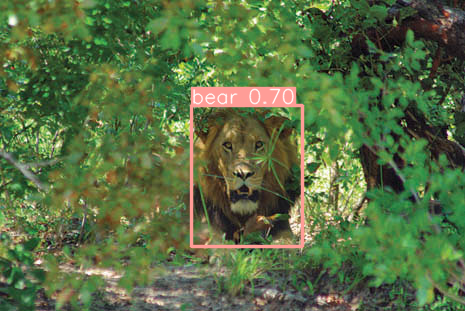

Model Bias: A Grenade located as a computer mouse - is detected as mouse 


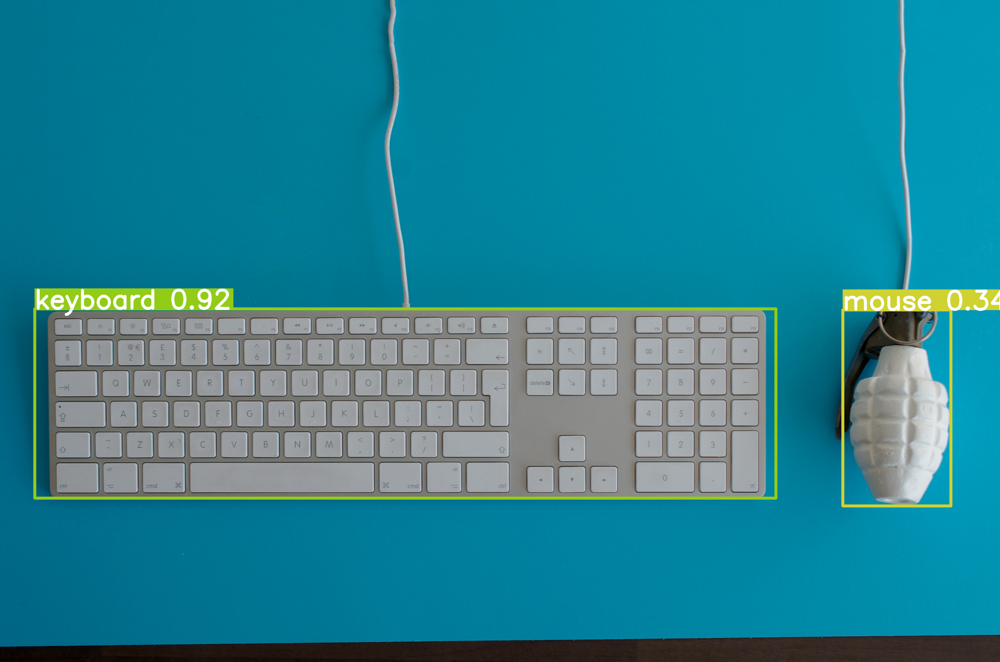

Deformed: A man leg looks like a woman body - 2 person figures are detected


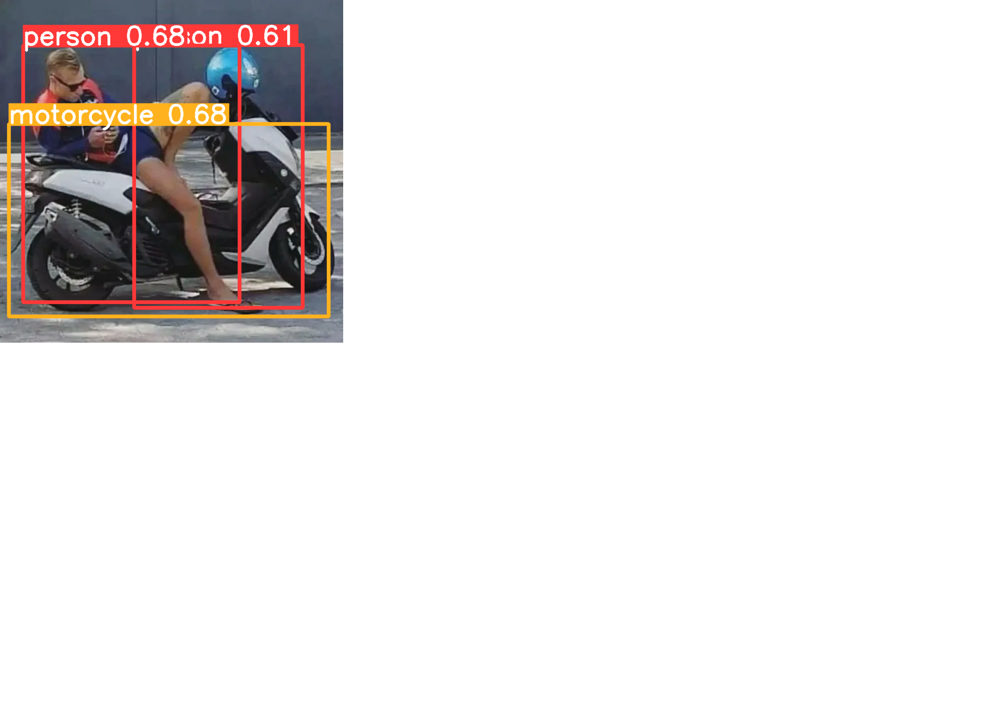

In [5]:
#Insert the inference code here.
results = model('imgs/lion-in-bush.jpg')
print('Occlusion: A lion stealthily conceals itself behind a bush - is detected as a Bear')
results.show()

results = model('imgs/grenade-mouse.jpg')
print('Model Bias: A Grenade located as a computer mouse - is detected as mouse ')
results.show()

results = model('imgs/man-bike.png')
print('Deformed: A man leg looks like a woman body - 2 person figures are detected')
results.show()

### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [6]:
display_answer(hw2.answers.part6_q3)



**Your answer:**

The model's object detection performance was not accurate in the given images due to certain challenges deliberately introduced.
In the first image of the lion in the forest, the model incorrectly identified the lion as a bear. This misclassification can be attributed to the lion's partial body figure being hidden among the trees, leaving only its face visible. This limited view likely confused the model, leading it to misinterpret the object.
In the second image featuring a keyboard and a hand grenade, the model mistakenly detected the grenade as a computer mouse, albeit with a low probability. This can be attributed to model bias, as it expects to encounter a computer mouse in proximity to a keyboard. This bias influenced the model's interpretation and resulted in an inaccurate detection.
In the third photo depicting a man sitting on a bike, the model detected his leg as a separate body figure, incorrectly associating the helmet with it as the head. Consequently, the model mistakenly identified two people in addition to the bike. This misinterpretation occurred due to the distorted figure of the person and the positioning of the helmet, which created a deceptive appearance that misled the model's detection process.

These intentional challenges were designed to highlight the model's limitations and showcase scenarios where it may struggle to accurately detect objects.



## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

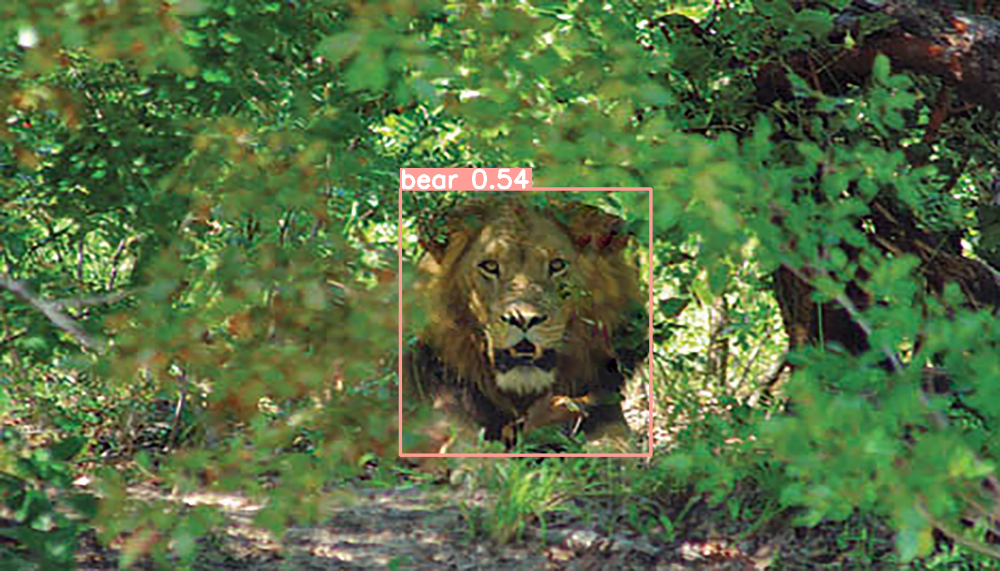

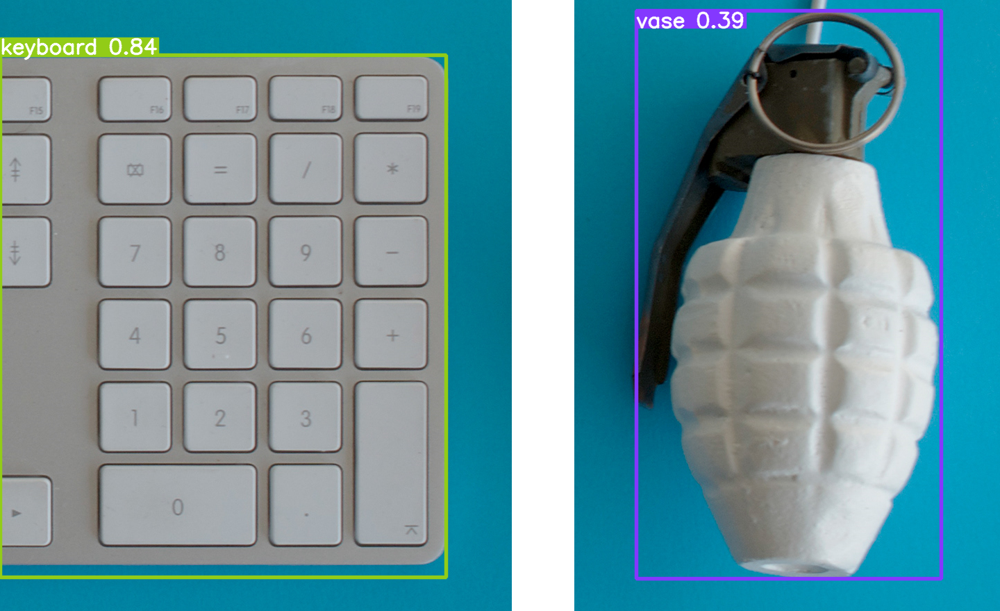

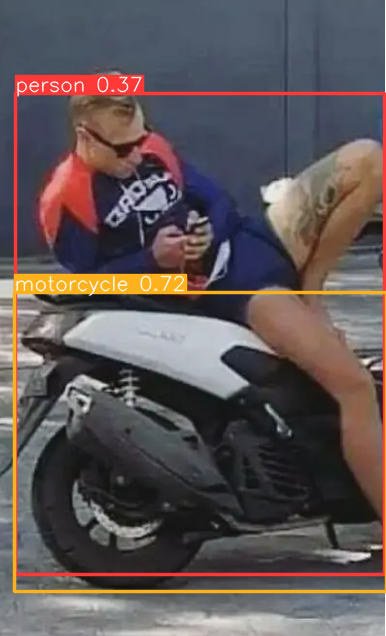

In [7]:
#insert bonus code here

#Insert the inference code here.
results = model('imgs/lion-in-bush-improved2.jpeg')
results.show()

results = model('imgs/mouse-grenade-newly-updated.png')
results.show()

results = model('imgs/man-bike-newly-updated.png')
results.show()


In [8]:
display_answer(hw2.answers.part6_bonus)



**Your answer:**

In an attempt to improve the model performance on poorly recognized images, several manipulations were made to the pictures in the exercise. Here are the modifications that were applied:

Lion in the forest:

Zoomed in to reduce the presence of trees, aiming to match the lion's typical habitat.
Cleared the leaves from the lion's face using Photoshop to enhance its visibility and distinguish it from a bear.
However, despite these changes, the model still misclassified the lion as a bear, albeit with a lower probability.

Keyboard and hand-grenade:

Zoomed in to exclude the cables in the image and avoid displaying the entire keyboard, which could confuse the model.
Drew a white line to create a visual separation between the keyboard and the hand-grenade.
Nevertheless, the modifications did not significantly improve the results. The keyboard was still recognized as a keyboard, while the hand-grenade was detected as a vase. It's possible that the model was not trained on images featuring "dangerous" or "illegal" objects, leading to such misclassifications to avoid potential issues.

Man on bike:

Removed the right part of the image containing the helmet to prevent the model from detecting it as another person.
This alteration successfully resulted in the detection of one person and one bike, compared to the previous identification of two people and one bike.

The modifications attempted to enhance the model's recognition by manipulating the images to align them more closely with the expected objects. However, in some cases, the changes did not produce the desired outcomes, suggesting limitations in the model's training or the complexity of distinguishing certain objects.

It's important to note that improving model performance may require additional steps, such as retraining the model with specialized datasets that include specific objects like hand-grenades or further fine-tuning to adapt to unique detection requirements.


